### Imports and Hyperparameters

In [1]:
import imgaug as ia
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import tensorflow as tf

root_path = os.path.abspath(os.path.join('..'))
if root_path not in sys.path:
    sys.path.append(root_path)

%matplotlib inline

In [2]:
import config

### A visualization helper function

In [3]:
def display_image(image, boxes=None, box_color=[0, 0, 255], box_thickness=3, ax=None):
    image = np.array(image)
    
    if boxes is not None:
        boxes = np.array(boxes)[..., :5]
        boxes = [ia.BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2, label=config.CLASSES[int(label)])
                 for x1, y1, x2, y2, label in boxes]
        boxes = ia.BoundingBoxesOnImage(boxes, shape=image.shape)
        image = boxes.draw_on_image(image, color=box_color,
                                    size=box_thickness)
    
    if ax is None:
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    else:
        ax.imshow(image)
        ax.axis('off')

### Load and visualize some image

Visualize some REAL images with their boxes for sanity checking 

Loaded 7144 image samples
Loaded 1000 image samples


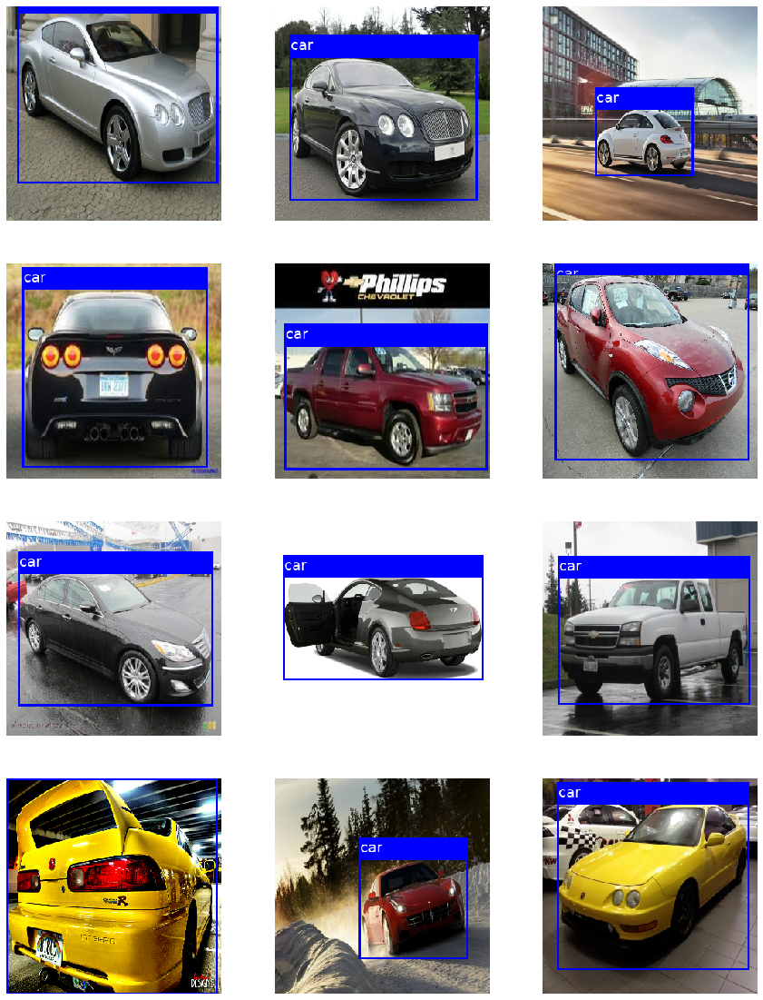

In [4]:
from cars_loader import load_cars, build_dataset

train_image_paths, train_bnd_boxes = load_cars(split='train')
valid_image_paths, valid_bnd_boxes = load_cars(split='valid')
data = build_dataset(train_image_paths, train_bnd_boxes,
                    image_size=config.IMAGE_SIZE)

num_display = 12
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(data)

for idx in range(num_display):
    x, y = next(data_iter)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

Loaded 10000 image samples


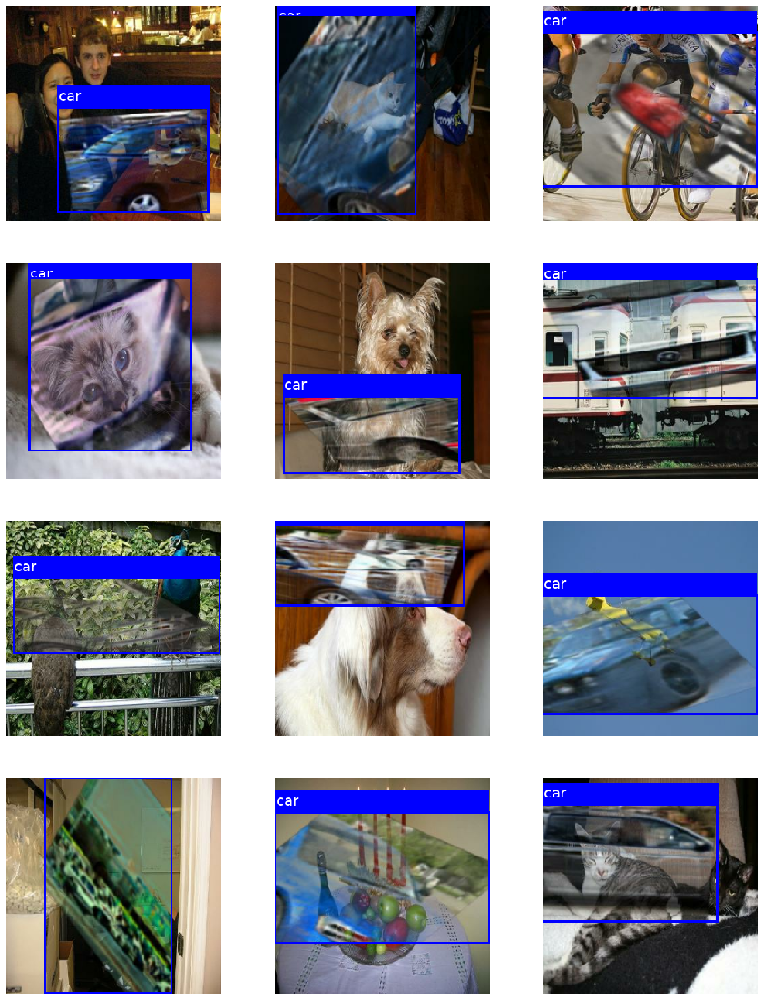

In [5]:
from cars_loader import load_cars, build_dataset

fake_image_paths, fake_bnd_boxes = load_cars(
    root=os.path.join('..', 'data', 'cars_fake'),
    split='fake')

data = build_dataset(fake_image_paths, fake_bnd_boxes,
                    image_size=config.IMAGE_SIZE)

num_display = 12
num_cols = 3
num_rows = (num_display+1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

data_iter = iter(data)

for idx in range(num_display):
    x, y = next(data_iter)
    display_image(x, y.to_tensor(), ax=fig.axes[idx])
    
plt.show()

## MobileNet

### Instantiate the model

In [6]:
from ssd_utils.networks.ssd_mobilenet import SSDMobileNet

model = SSDMobileNet(num_classes=len(config.CLASSES), name='ssd_mobilenet')

### Create the data pipelines

In [7]:
anchors = model.get_anchors(image_shape=config.IMAGE_SIZE + (3,))

fake_data = build_dataset(fake_image_paths, fake_bnd_boxes,
                          image_size=config.IMAGE_SIZE,
                          batch_size=config.BATCH_SIZE,
                          repeat=True, shuffle=True,
                          encode_output=True,
                          anchors=anchors,
                          model=model)

train_data = build_dataset(train_image_paths, train_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=True, shuffle=True,
                           encode_output=True,
                           anchors=anchors,
                           model=model)

valid_data = build_dataset(valid_image_paths, valid_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=False, shuffle=False,
                           encode_output=False)

for data in [fake_data, train_data, valid_data]:
    x, y = next(iter(data))
    print(x.shape, y.shape)

(16, 300, 300, 3) (16, 2430, 6)
(16, 300, 300, 3) (16, 2430, 6)
(16, 300, 300, 3) (16, None, None)


### Pretrain the model on fake data

In [8]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('mobilenet_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(fake_data, epochs=config.NUM_EPOCHS * 2,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 18.1290

Calculating Average Precision...: 45it [00:00, 448.18it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 358.48it/s]


25/25 [==============================] - 32s 1s/step - loss: 18.1290 - val_meanAP: 0.0133
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 6.1958

Calculating Average Precision...: 29it [00:00, 283.80it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:05, 194.30it/s]


25/25 [==============================] - 39s 2s/step - loss: 6.1958 - val_meanAP: 0.0371
Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 5.0006

Calculating Average Precision...: 15it [00:00, 140.36it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:07, 135.87it/s]

25/25 [==============================] - 40s 2s/step - loss: 5.0006 - val_meanAP: 0.0666


Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 4.1539

Calculating Average Precision...: 16it [00:00, 154.91it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:06, 152.73it/s]


25/25 [==============================] - 43s 2s/step - loss: 4.1539 - val_meanAP: 0.0785
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 3.5183

Calculating Average Precision...: 18it [00:00, 172.59it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:05, 180.20it/s]


25/25 [==============================] - 37s 1s/step - loss: 3.5183 - val_meanAP: 0.0809
Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 3.0588

Calculating Average Precision...: 28it [00:00, 278.55it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 293.84it/s]


25/25 [==============================] - 36s 1s/step - loss: 3.0588 - val_meanAP: 0.1145
Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 2.6268

Calculating Average Precision...: 17it [00:00, 159.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:05, 191.40it/s]

25/25 [==============================] - 41s 2s/step - loss: 2.6268 - val_meanAP: 0.0994


Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 2.3933

Calculating Average Precision...: 25it [00:00, 246.41it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 210.11it/s]


25/25 [==============================] - 38s 2s/step - loss: 2.3933 - val_meanAP: 0.1253
Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 2.1926

Calculating Average Precision...: 34it [00:00, 335.10it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 328.13it/s]

25/25 [==============================] - 36s 1s/step - loss: 2.1926 - val_meanAP: 0.1097


Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 1.9554

Calculating Average Precision...: 38it [00:00, 377.98it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 288.55it/s]

25/25 [==============================] - 31s 1s/step - loss: 1.9554 - val_meanAP: 0.1028


Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 1.8248

Calculating Average Precision...: 28it [00:00, 274.48it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 245.12it/s]


25/25 [==============================] - 36s 1s/step - loss: 1.8248 - val_meanAP: 0.1307
Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 1.7496

Calculating Average Precision...: 17it [00:00, 170.00it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 217.45it/s]


25/25 [==============================] - 39s 2s/step - loss: 1.7496 - val_meanAP: 0.1468
Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 1.5589

Calculating Average Precision...: 29it [00:00, 281.03it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 266.85it/s]


25/25 [==============================] - 34s 1s/step - loss: 1.5589 - val_meanAP: 0.1897
Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 1.5690

Calculating Average Precision...: 34it [00:00, 338.43it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 343.92it/s]


25/25 [==============================] - 34s 1s/step - loss: 1.5690 - val_meanAP: 0.2193
Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 1.4004

Calculating Average Precision...: 43it [00:00, 422.82it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 366.11it/s]

25/25 [==============================] - 34s 1s/step - loss: 1.4004 - val_meanAP: 0.2145


Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 1.3243

Calculating Average Precision...: 49it [00:00, 483.01it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 424.57it/s]

25/25 [==============================] - 50s 2s/step - loss: 1.3243 - val_meanAP: 0.2152


Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 1.3250

Calculating Average Precision...: 58it [00:00, 563.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 415.22it/s]

25/25 [==============================] - 45s 2s/step - loss: 1.3250 - val_meanAP: 0.2153


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 1.2704

Calculating Average Precision...: 53it [00:00, 511.35it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 436.44it/s]


25/25 [==============================] - 48s 2s/step - loss: 1.2704 - val_meanAP: 0.2440
Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 1.2512

Calculating Average Precision...: 42it [00:00, 413.51it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 437.10it/s]


25/25 [==============================] - 54s 2s/step - loss: 1.2512 - val_meanAP: 0.2836
Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 1.1382

Calculating Average Precision...: 82it [00:00, 810.61it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 579.44it/s]

25/25 [==============================] - 40s 2s/step - loss: 1.1382 - val_meanAP: 0.2735


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 1.0990

Calculating Average Precision...: 89it [00:00, 885.97it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 774.67it/s]


25/25 [==============================] - 31s 1s/step - loss: 1.0990 - val_meanAP: 0.2911
Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 1.0463

Calculating Average Precision...: 91it [00:00, 908.04it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 894.85it/s]

25/25 [==============================] - 26s 1s/step - loss: 1.0463 - val_meanAP: 0.2791


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 1.0308

Calculating Average Precision...: 90it [00:00, 891.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 825.29it/s]


25/25 [==============================] - 25s 990ms/step - loss: 1.0308 - val_meanAP: 0.3499
Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 0.9782

Calculating Average Precision...: 120it [00:00, 1176.78it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 963.60it/s]

25/25 [==============================] - 23s 912ms/step - loss: 0.9782 - val_meanAP: 0.3296


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 0.9291

Calculating Average Precision...: 103it [00:00, 1019.29it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 940.15it/s]


25/25 [==============================] - 25s 1s/step - loss: 0.9291 - val_meanAP: 0.3883
Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 0.9122

Calculating Average Precision...: 89it [00:00, 884.24it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 838.57it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.9122 - val_meanAP: 0.3670


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 0.8583

Calculating Average Precision...: 107it [00:00, 1064.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 978.79it/s]

25/25 [==============================] - 22s 866ms/step - loss: 0.8583 - val_meanAP: 0.3830


Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 0.8393

Calculating Average Precision...: 109it [00:00, 1072.65it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1130.67it/s]

25/25 [==============================] - 20s 809ms/step - loss: 0.8393 - val_meanAP: 0.3485


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 0.8741

Calculating Average Precision...: 146it [00:00, 1447.50it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1285.76it/s]

25/25 [==============================] - 20s 784ms/step - loss: 0.8741 - val_meanAP: 0.3510


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 0.8833

Calculating Average Precision...: 108it [00:00, 1064.94it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1066.52it/s]

25/25 [==============================] - 20s 813ms/step - loss: 0.8833 - val_meanAP: 0.3646


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 0.7796

Calculating Average Precision...: 165it [00:00, 1642.71it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1321.14it/s]

25/25 [==============================] - 19s 780ms/step - loss: 0.7796 - val_meanAP: 0.3382


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 0.7647

Calculating Average Precision...: 103it [00:00, 1021.80it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1042.10it/s]

25/25 [==============================] - 21s 825ms/step - loss: 0.7647 - val_meanAP: 0.3463


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 0.7576

Calculating Average Precision...: 157it [00:00, 1557.57it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1486.92it/s]

25/25 [==============================] - 19s 770ms/step - loss: 0.7576 - val_meanAP: 0.3435


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 0.7546

Calculating Average Precision...: 134it [00:00, 1320.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1370.84it/s]

25/25 [==============================] - 19s 778ms/step - loss: 0.7546 - val_meanAP: 0.3248


Epoch 35/40
25/25 [==============================] - ETA: 0s - loss: 0.7048

Calculating Average Precision...: 136it [00:00, 1344.26it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1302.99it/s]

25/25 [==============================] - 20s 784ms/step - loss: 0.7048 - val_meanAP: 0.3085


Epoch 36/40
25/25 [==============================] - ETA: 0s - loss: 0.7234

Calculating Average Precision...: 141it [00:00, 1383.09it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1243.27it/s]

25/25 [==============================] - 20s 788ms/step - loss: 0.7234 - val_meanAP: 0.3210


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 0.7000

Calculating Average Precision...: 121it [00:00, 1204.24it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1076.81it/s]


25/25 [==============================] - 21s 829ms/step - loss: 0.7000 - val_meanAP: 0.4044
Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 0.6765

Calculating Average Precision...: 108it [00:00, 1066.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1017.14it/s]

25/25 [==============================] - 20s 816ms/step - loss: 0.6765 - val_meanAP: 0.3870


Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 0.6575

Calculating Average Precision...: 172it [00:00, 1717.70it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1349.71it/s]

25/25 [==============================] - 20s 781ms/step - loss: 0.6575 - val_meanAP: 0.3141


Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 0.6336

Calculating Average Precision...: 149it [00:00, 1484.89it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1460.06it/s]

25/25 [==============================] - 19s 764ms/step - loss: 0.6336 - val_meanAP: 0.3138


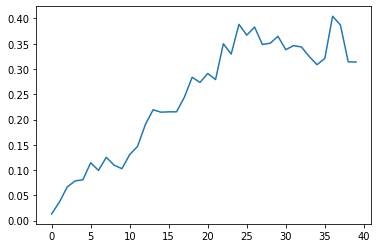

In [9]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 97it [00:00, 969.39it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1075.34it/s]


Validation meanAP: tf.Tensor(0.4043697787044941, shape=(), dtype=float64)


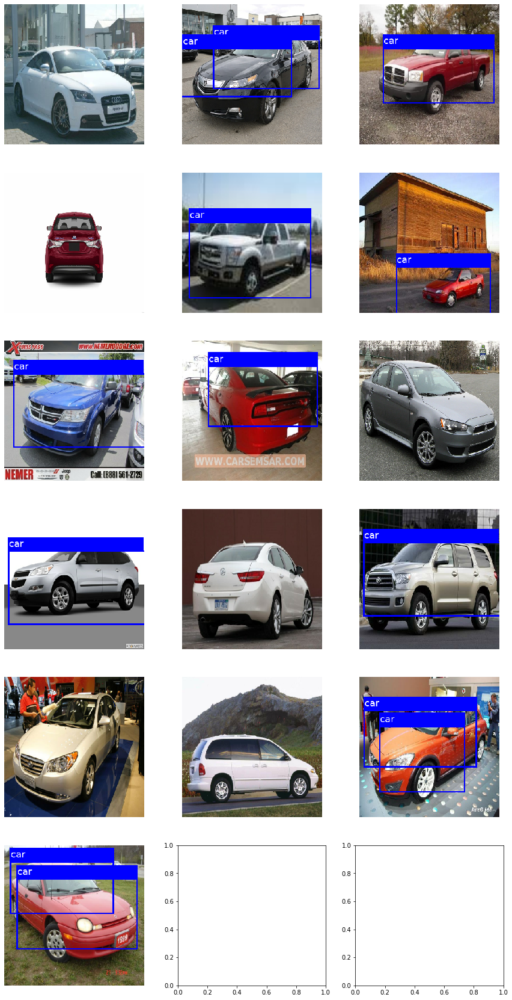

In [10]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'mobilenet_pretrain.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

### Fintetune the model on real data

In [11]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('mobilenet_finetune.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(train_data, epochs=config.NUM_EPOCHS,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/20
25/25 [==============================] - ETA: 0s - loss: 0.7677

Calculating Average Precision...: 72it [00:00, 712.60it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 758.04it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.7677 - val_meanAP: 0.9826


Epoch 2/20
25/25 [==============================] - ETA: 0s - loss: 0.5058

Calculating Average Precision...: 62it [00:00, 611.35it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 714.27it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.5058 - val_meanAP: 0.9638


Epoch 3/20
25/25 [==============================] - ETA: 0s - loss: 0.3942

Calculating Average Precision...: 64it [00:00, 635.76it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 672.01it/s]


25/25 [==============================] - 33s 1s/step - loss: 0.3942 - val_meanAP: 0.9912
Epoch 4/20
25/25 [==============================] - ETA: 0s - loss: 0.3693

Calculating Average Precision...: 69it [00:00, 689.53it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 778.60it/s]


25/25 [==============================] - 26s 1s/step - loss: 0.3693 - val_meanAP: 0.9915
Epoch 5/20
25/25 [==============================] - ETA: 0s - loss: 0.3621

Calculating Average Precision...: 70it [00:00, 691.29it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 743.11it/s]


25/25 [==============================] - 28s 1s/step - loss: 0.3621 - val_meanAP: 0.9967
Epoch 6/20
25/25 [==============================] - ETA: 0s - loss: 0.3268

Calculating Average Precision...: 70it [00:00, 686.64it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 700.55it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.3268 - val_meanAP: 0.9965


Epoch 7/20
25/25 [==============================] - ETA: 0s - loss: 0.2846

Calculating Average Precision...: 70it [00:00, 697.50it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 717.91it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.2846 - val_meanAP: 0.9954


Epoch 8/20
25/25 [==============================] - ETA: 0s - loss: 0.2827

Calculating Average Precision...: 55it [00:00, 542.26it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 580.64it/s]

25/25 [==============================] - 38s 2s/step - loss: 0.2827 - val_meanAP: 0.9965


Epoch 9/20
25/25 [==============================] - ETA: 0s - loss: 0.2560

Calculating Average Precision...: 70it [00:00, 697.45it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 698.53it/s]


25/25 [==============================] - 42s 2s/step - loss: 0.2560 - val_meanAP: 0.9978
Epoch 10/20
25/25 [==============================] - ETA: 0s - loss: 0.2518

Calculating Average Precision...: 48it [00:00, 471.60it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 567.37it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.2518 - val_meanAP: 0.9972


Epoch 11/20
25/25 [==============================] - ETA: 0s - loss: 0.2792

Calculating Average Precision...: 63it [00:00, 628.86it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 682.24it/s]


25/25 [==============================] - 29s 1s/step - loss: 0.2792 - val_meanAP: 0.9987
Epoch 12/20
25/25 [==============================] - ETA: 0s - loss: 0.2783

Calculating Average Precision...: 56it [00:00, 550.09it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 643.96it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2783 - val_meanAP: 0.9453


Epoch 13/20
25/25 [==============================] - ETA: 0s - loss: 0.2186

Calculating Average Precision...: 71it [00:00, 699.88it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 645.82it/s]

25/25 [==============================] - 27s 1s/step - loss: 0.2186 - val_meanAP: 0.9975


Epoch 14/20
25/25 [==============================] - ETA: 0s - loss: 0.2267

Calculating Average Precision...: 62it [00:00, 611.93it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 742.90it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2267 - val_meanAP: 0.9982


Epoch 15/20
25/25 [==============================] - ETA: 0s - loss: 0.2240

Calculating Average Precision...: 61it [00:00, 608.61it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 669.77it/s]


25/25 [==============================] - 28s 1s/step - loss: 0.2240 - val_meanAP: 0.9995
Epoch 16/20
25/25 [==============================] - ETA: 0s - loss: 0.2090

Calculating Average Precision...: 73it [00:00, 727.04it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 718.86it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2090 - val_meanAP: 0.9969


Epoch 17/20
25/25 [==============================] - ETA: 0s - loss: 0.2114

Calculating Average Precision...: 71it [00:00, 698.27it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 663.16it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.2114 - val_meanAP: 0.9972


Epoch 18/20
25/25 [==============================] - ETA: 0s - loss: 0.1953

Calculating Average Precision...: 74it [00:00, 738.34it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 781.42it/s]

25/25 [==============================] - 37s 1s/step - loss: 0.1953 - val_meanAP: 0.9984


Epoch 19/20
25/25 [==============================] - ETA: 0s - loss: 0.1915

Calculating Average Precision...: 71it [00:00, 701.49it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 770.81it/s]

25/25 [==============================] - 41s 2s/step - loss: 0.1915 - val_meanAP: 0.9974


Epoch 20/20
25/25 [==============================] - ETA: 0s - loss: 0.1917

Calculating Average Precision...: 80it [00:00, 797.99it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 884.81it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.1917 - val_meanAP: 0.9985


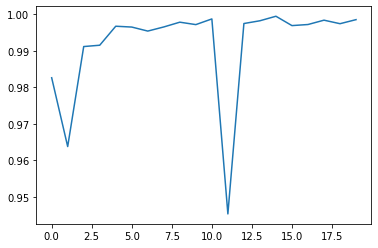

In [12]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 84it [00:00, 838.00it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 874.50it/s]


Validation meanAP: tf.Tensor(0.9994656176111288, shape=(), dtype=float64)


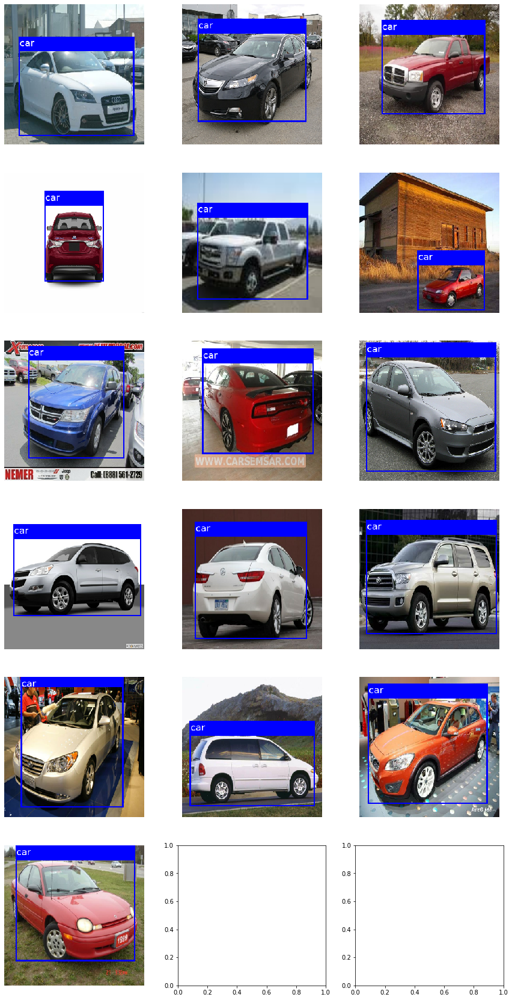

In [13]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'mobilenet_finetune.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()

## ResNet50

### Instantiate the model

In [6]:
from ssd_utils.networks.ssd_resnet50 import SSDResNet50

model = SSDResNet50(num_classes=len(config.CLASSES), name='ssd_resnet50')

### Create the data pipelines

In [7]:
anchors = model.get_anchors(image_shape=config.IMAGE_SIZE + (3,))

fake_data = build_dataset(fake_image_paths, fake_bnd_boxes,
                          image_size=config.IMAGE_SIZE,
                          batch_size=config.BATCH_SIZE,
                          repeat=True, shuffle=True,
                          encode_output=True,
                          anchors=anchors,
                          model=model)

train_data = build_dataset(train_image_paths, train_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=True, shuffle=True,
                           encode_output=True,
                           anchors=anchors,
                           model=model)

valid_data = build_dataset(valid_image_paths, valid_bnd_boxes,
                           image_size=config.IMAGE_SIZE,
                           batch_size=config.BATCH_SIZE,
                           repeat=False, shuffle=False,
                           encode_output=False)

for data in [fake_data, train_data, valid_data]:
    x, y = next(iter(data))
    print(x.shape, y.shape)

(16, 300, 300, 3) (16, 4149, 6)
(16, 300, 300, 3) (16, 4149, 6)
(16, 300, 300, 3) (16, None, None)


### Pretrain the model on fake data

In [8]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('resnet50_pretrain.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(fake_data, epochs=config.NUM_EPOCHS * 2,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/40
25/25 [==============================] - ETA: 0s - loss: 13.4846

Calculating Average Precision...: 9it [00:00, 85.22it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:11, 86.40it/s]


25/25 [==============================] - 68s 3s/step - loss: 13.4846 - val_meanAP: 0.1895
Epoch 2/40
25/25 [==============================] - ETA: 0s - loss: 2.9358

Calculating Average Precision...: 11it [00:00, 106.97it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:08, 112.69it/s]


25/25 [==============================] - 59s 2s/step - loss: 2.9358 - val_meanAP: 0.2960
Epoch 3/40
25/25 [==============================] - ETA: 0s - loss: 2.1313

Calculating Average Precision...: 20it [00:00, 191.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:05, 186.18it/s]


25/25 [==============================] - 51s 2s/step - loss: 2.1313 - val_meanAP: 0.4337
Epoch 4/40
25/25 [==============================] - ETA: 0s - loss: 1.6333

Calculating Average Precision...: 36it [00:00, 348.61it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 228.89it/s]


25/25 [==============================] - 47s 2s/step - loss: 1.6333 - val_meanAP: 0.5177
Epoch 5/40
25/25 [==============================] - ETA: 0s - loss: 1.3951

Calculating Average Precision...: 32it [00:00, 304.02it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 230.70it/s]

25/25 [==============================] - 47s 2s/step - loss: 1.3951 - val_meanAP: 0.4074


Epoch 6/40
25/25 [==============================] - ETA: 0s - loss: 1.1382

Calculating Average Precision...: 51it [00:00, 502.01it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 380.42it/s]

25/25 [==============================] - 42s 2s/step - loss: 1.1382 - val_meanAP: 0.4206


Epoch 7/40
25/25 [==============================] - ETA: 0s - loss: 0.9529

Calculating Average Precision...: 62it [00:00, 589.81it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 336.86it/s]

25/25 [==============================] - 40s 2s/step - loss: 0.9529 - val_meanAP: 0.4226


Epoch 8/40
25/25 [==============================] - ETA: 0s - loss: 0.8302

Calculating Average Precision...: 51it [00:00, 507.21it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 398.15it/s]

25/25 [==============================] - 44s 2s/step - loss: 0.8302 - val_meanAP: 0.4241


Epoch 9/40
25/25 [==============================] - ETA: 0s - loss: 0.7902

Calculating Average Precision...: 75it [00:00, 746.09it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 490.13it/s]

25/25 [==============================] - 40s 2s/step - loss: 0.7902 - val_meanAP: 0.3043


Epoch 10/40
25/25 [==============================] - ETA: 0s - loss: 0.6629

Calculating Average Precision...: 83it [00:00, 823.22it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 617.51it/s]

25/25 [==============================] - 39s 2s/step - loss: 0.6629 - val_meanAP: 0.3811


Epoch 11/40
25/25 [==============================] - ETA: 0s - loss: 0.6580

Calculating Average Precision...: 74it [00:00, 728.43it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 597.18it/s]

25/25 [==============================] - 39s 2s/step - loss: 0.6580 - val_meanAP: 0.3739


Epoch 12/40
25/25 [==============================] - ETA: 0s - loss: 0.5804

Calculating Average Precision...: 88it [00:00, 847.72it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 772.03it/s]

25/25 [==============================] - 38s 2s/step - loss: 0.5804 - val_meanAP: 0.3701


Epoch 13/40
25/25 [==============================] - ETA: 0s - loss: 0.5652

Calculating Average Precision...: 94it [00:00, 939.80it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 940.55it/s]

25/25 [==============================] - 34s 1s/step - loss: 0.5652 - val_meanAP: 0.3541


Epoch 14/40
25/25 [==============================] - ETA: 0s - loss: 0.5380

Calculating Average Precision...: 107it [00:00, 1060.51it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1195.87it/s]

25/25 [==============================] - 34s 1s/step - loss: 0.5380 - val_meanAP: 0.2594


Epoch 15/40
25/25 [==============================] - ETA: 0s - loss: 0.5267

Calculating Average Precision...: 127it [00:00, 1255.23it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1201.10it/s]

25/25 [==============================] - 33s 1s/step - loss: 0.5267 - val_meanAP: 0.2567


Epoch 16/40
25/25 [==============================] - ETA: 0s - loss: 0.4879

Calculating Average Precision...: 156it [00:00, 1553.60it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1421.94it/s]


25/25 [==============================] - 33s 1s/step - loss: 0.4879 - val_meanAP: 0.2819
Epoch 17/40
25/25 [==============================] - ETA: 0s - loss: 0.5196

Calculating Average Precision...: 200it [00:00, 1994.59it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1686.07it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.5196 - val_meanAP: 0.2008


Epoch 18/40
25/25 [==============================] - ETA: 0s - loss: 0.4320

Calculating Average Precision...: 183it [00:00, 1805.47it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 1763.63it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.4320 - val_meanAP: 0.1944


Epoch 19/40
25/25 [==============================] - ETA: 0s - loss: 0.4103

Calculating Average Precision...: 274it [00:00, 2738.94it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2208.37it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.4103 - val_meanAP: 0.1663


Epoch 20/40
25/25 [==============================] - ETA: 0s - loss: 0.4533

Calculating Average Precision...: 252it [00:00, 2516.91it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2182.90it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.4533 - val_meanAP: 0.1871


Epoch 21/40
25/25 [==============================] - ETA: 0s - loss: 0.4157

Calculating Average Precision...: 240it [00:00, 2380.78it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2353.05it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.4157 - val_meanAP: 0.1725


Epoch 22/40
25/25 [==============================] - ETA: 0s - loss: 0.3894

Calculating Average Precision...: 252it [00:00, 2501.95it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2434.10it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.3894 - val_meanAP: 0.1644


Epoch 23/40
25/25 [==============================] - ETA: 0s - loss: 0.3876

Calculating Average Precision...: 274it [00:00, 2734.32it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2619.24it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.3876 - val_meanAP: 0.1641


Epoch 24/40
25/25 [==============================] - ETA: 0s - loss: 0.3940

Calculating Average Precision...: 298it [00:00, 2965.07it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2712.82it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.3940 - val_meanAP: 0.1448


Epoch 25/40
25/25 [==============================] - ETA: 0s - loss: 0.3598

Calculating Average Precision...: 249it [00:00, 2489.02it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2095.08it/s]

25/25 [==============================] - 32s 1s/step - loss: 0.3598 - val_meanAP: 0.2603


Epoch 26/40
25/25 [==============================] - ETA: 0s - loss: 0.3564

Calculating Average Precision...: 252it [00:00, 2515.90it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2533.76it/s]

25/25 [==============================] - 31s 1s/step - loss: 0.3564 - val_meanAP: 0.1686


Epoch 27/40
25/25 [==============================] - ETA: 0s - loss: 0.3099

Calculating Average Precision...: 224it [00:00, 2234.83it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2503.63it/s]


25/25 [==============================] - 32s 1s/step - loss: 0.3099 - val_meanAP: 0.1461
Epoch 28/40
25/25 [==============================] - ETA: 0s - loss: 0.3416

Calculating Average Precision...: 360it [00:00, 3576.85it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3130.43it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.3416 - val_meanAP: 0.1249


Epoch 29/40
25/25 [==============================] - ETA: 0s - loss: 0.3218

Calculating Average Precision...: 407it [00:00, 4042.94it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3813.76it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.3218 - val_meanAP: 0.0819


Epoch 30/40
25/25 [==============================] - ETA: 0s - loss: 0.3072

Calculating Average Precision...: 310it [00:00, 3094.83it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3127.42it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.3072 - val_meanAP: 0.1126


Epoch 31/40
25/25 [==============================] - ETA: 0s - loss: 0.2684

Calculating Average Precision...: 400it [00:00, 3980.11it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4493.67it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.2684 - val_meanAP: 0.0697


Epoch 32/40
25/25 [==============================] - ETA: 0s - loss: 0.2969

Calculating Average Precision...: 456it [00:00, 4526.20it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4695.41it/s]

25/25 [==============================] - 28s 1s/step - loss: 0.2969 - val_meanAP: 0.0834


Epoch 33/40
25/25 [==============================] - ETA: 0s - loss: 0.2753

Calculating Average Precision...: 397it [00:00, 3968.79it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 4021.82it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2753 - val_meanAP: 0.1199


Epoch 34/40
25/25 [==============================] - ETA: 0s - loss: 0.2698

Calculating Average Precision...: 422it [00:00, 4207.73it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3811.41it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2698 - val_meanAP: 0.1061


Epoch 35/40
25/25 [==============================] - ETA: 0s - loss: 0.2359

Calculating Average Precision...: 422it [00:00, 4206.86it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3819.82it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2359 - val_meanAP: 0.1015


Epoch 36/40
25/25 [==============================] - ETA: 0s - loss: 0.2927

Calculating Average Precision...: 350it [00:00, 3463.29it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3543.54it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2927 - val_meanAP: 0.1177


Epoch 37/40
25/25 [==============================] - ETA: 0s - loss: 0.2678

Calculating Average Precision...: 388it [00:00, 3863.43it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3313.32it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2678 - val_meanAP: 0.1494


Epoch 38/40
25/25 [==============================] - ETA: 0s - loss: 0.2575

Calculating Average Precision...: 348it [00:00, 3465.36it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3677.04it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2575 - val_meanAP: 0.1142


Epoch 39/40
25/25 [==============================] - ETA: 0s - loss: 0.2582

Calculating Average Precision...: 265it [00:00, 2648.62it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 2512.56it/s]

25/25 [==============================] - 30s 1s/step - loss: 0.2582 - val_meanAP: 0.1572


Epoch 40/40
25/25 [==============================] - ETA: 0s - loss: 0.2211

Calculating Average Precision...: 368it [00:00, 3674.10it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:00, 3359.47it/s]

25/25 [==============================] - 29s 1s/step - loss: 0.2211 - val_meanAP: 0.1139


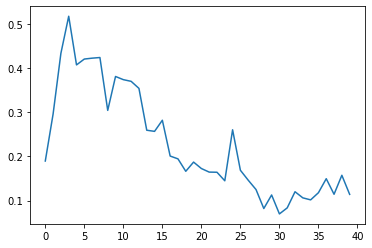

In [9]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 19it [00:00, 189.31it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 230.59it/s]


Validation meanAP: tf.Tensor(0.5176504997059109, shape=(), dtype=float64)


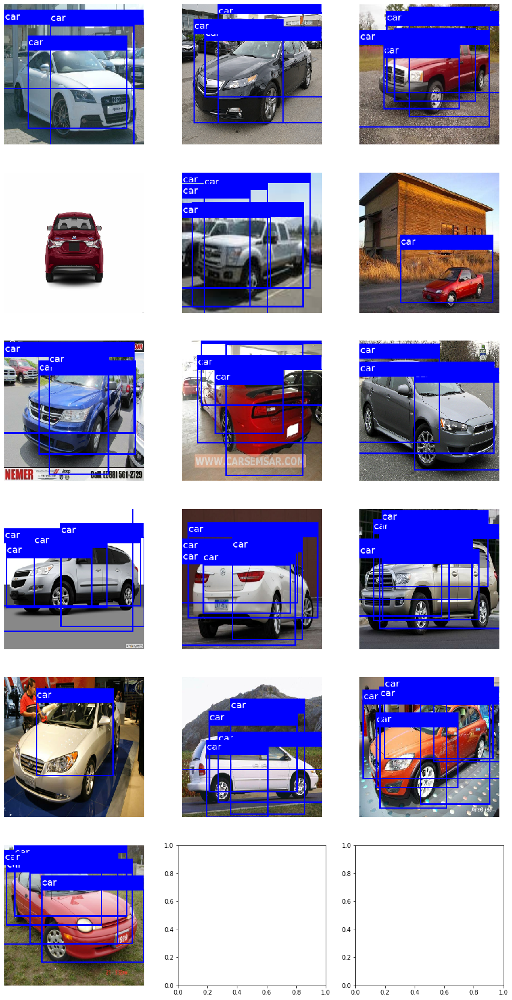

In [10]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'resnet50_pretrain.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()


### Fintetune the model on real data

In [11]:
from ssd_utils.ssd_loss import SSDLoss
from ssd_utils.metrics import MeanAveragePrecision
from tensorflow.keras.callbacks import ModelCheckpoint

from ssd_utils import output_encoder
from utils import MeanAveragePrecisionCallback

ssd_loss = SSDLoss()
        
meanAP_callback = MeanAveragePrecisionCallback(data=valid_data,
                                               anchors=anchors)

ckpt_callback = ModelCheckpoint('resnet50_finetune.h5',
                                monitor='val_meanAP',
                                mode='max',
                                save_best_only=True,
                                save_weights_only=True)        

        
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss=ssd_loss)

history = model.fit(train_data, epochs=config.NUM_EPOCHS,
          steps_per_epoch=config.STEPS_PER_EPOCH,
          callbacks=[meanAP_callback, ckpt_callback])

Epoch 1/20
25/25 [==============================] - ETA: 0s - loss: 0.8725

Calculating Average Precision...: 24it [00:00, 231.82it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:04, 245.77it/s]


25/25 [==============================] - 44s 2s/step - loss: 0.8725 - val_meanAP: 0.6397
Epoch 2/20
25/25 [==============================] - ETA: 0s - loss: 0.5420

Calculating Average Precision...: 23it [00:00, 228.12it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:03, 286.46it/s]


25/25 [==============================] - 43s 2s/step - loss: 0.5420 - val_meanAP: 0.9643
Epoch 3/20
25/25 [==============================] - ETA: 0s - loss: 0.3787

Calculating Average Precision...: 42it [00:00, 413.26it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:02, 394.91it/s]


25/25 [==============================] - 46s 2s/step - loss: 0.3787 - val_meanAP: 0.9967
Epoch 4/20
25/25 [==============================] - ETA: 0s - loss: 0.3533

Calculating Average Precision...: 53it [00:00, 517.65it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 524.52it/s]


25/25 [==============================] - 44s 2s/step - loss: 0.3533 - val_meanAP: 0.9973
Epoch 5/20
25/25 [==============================] - ETA: 0s - loss: 0.3173

Calculating Average Precision...: 73it [00:00, 718.16it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 682.14it/s]


25/25 [==============================] - 45s 2s/step - loss: 0.3173 - val_meanAP: 0.9976
Epoch 6/20
25/25 [==============================] - ETA: 0s - loss: 0.2913

Calculating Average Precision...: 71it [00:00, 707.17it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 666.27it/s]


25/25 [==============================] - 42s 2s/step - loss: 0.2913 - val_meanAP: 0.9987
Epoch 7/20
25/25 [==============================] - ETA: 0s - loss: 0.2487

Calculating Average Precision...: 77it [00:00, 760.09it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 773.99it/s]

25/25 [==============================] - 39s 2s/step - loss: 0.2487 - val_meanAP: 0.9985


Epoch 8/20
25/25 [==============================] - ETA: 0s - loss: 0.2160

Calculating Average Precision...: 69it [00:00, 689.20it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 709.17it/s]

25/25 [==============================] - 37s 1s/step - loss: 0.2160 - val_meanAP: 0.9960


Epoch 9/20
25/25 [==============================] - ETA: 0s - loss: 0.2421

Calculating Average Precision...: 77it [00:00, 757.58it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 792.04it/s]


25/25 [==============================] - 38s 2s/step - loss: 0.2421 - val_meanAP: 0.9999
Epoch 10/20
25/25 [==============================] - ETA: 0s - loss: 0.2231

Calculating Average Precision...: 77it [00:00, 753.11it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 770.80it/s]

25/25 [==============================] - 37s 1s/step - loss: 0.2231 - val_meanAP: 0.9989


Epoch 11/20
25/25 [==============================] - ETA: 0s - loss: 0.2427

Calculating Average Precision...: 80it [00:00, 796.98it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 858.58it/s]


25/25 [==============================] - 42s 2s/step - loss: 0.2427 - val_meanAP: 1.0000
Epoch 12/20
25/25 [==============================] - ETA: 0s - loss: 0.2257

Calculating Average Precision...: 71it [00:00, 702.55it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 824.22it/s]

25/25 [==============================] - 38s 2s/step - loss: 0.2257 - val_meanAP: 1.0000


Epoch 13/20
25/25 [==============================] - ETA: 0s - loss: 0.1782

Calculating Average Precision...: 79it [00:00, 785.46it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 803.86it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1782 - val_meanAP: 1.0000


Epoch 14/20
25/25 [==============================] - ETA: 0s - loss: 0.2253

Calculating Average Precision...: 78it [00:00, 773.08it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 814.12it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.2253 - val_meanAP: 0.9988


Epoch 15/20
25/25 [==============================] - ETA: 0s - loss: 0.2011

Calculating Average Precision...: 79it [00:00, 785.86it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 866.64it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.2011 - val_meanAP: 0.9998


Epoch 16/20
25/25 [==============================] - ETA: 0s - loss: 0.1752

Calculating Average Precision...: 87it [00:00, 855.93it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 874.47it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1752 - val_meanAP: 1.0000


Epoch 17/20
25/25 [==============================] - ETA: 0s - loss: 0.1820

Calculating Average Precision...: 82it [00:00, 813.30it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 870.80it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1820 - val_meanAP: 1.0000


Epoch 18/20
25/25 [==============================] - ETA: 0s - loss: 0.1756

Calculating Average Precision...: 85it [00:00, 843.52it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 879.23it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1756 - val_meanAP: 1.0000


Epoch 19/20
25/25 [==============================] - ETA: 0s - loss: 0.1557

Calculating Average Precision...: 77it [00:00, 765.59it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 836.74it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1557 - val_meanAP: 0.9999


Epoch 20/20
25/25 [==============================] - ETA: 0s - loss: 0.1657

Calculating Average Precision...: 85it [00:00, 844.09it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 858.67it/s]

25/25 [==============================] - 36s 1s/step - loss: 0.1657 - val_meanAP: 1.0000


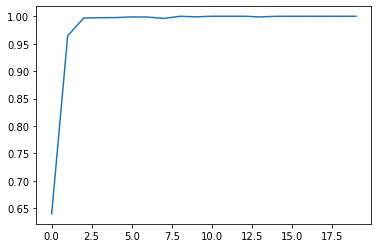

In [12]:
plt.plot(history.history['val_meanAP'])

Calculating Average Precision...: 74it [00:00, 732.26it/s]


Calculating Average Precision for class 1.0


Calculating Average Precision...: 1000it [00:01, 834.02it/s]


Validation meanAP: tf.Tensor(0.9999910199222769, shape=(), dtype=float64)


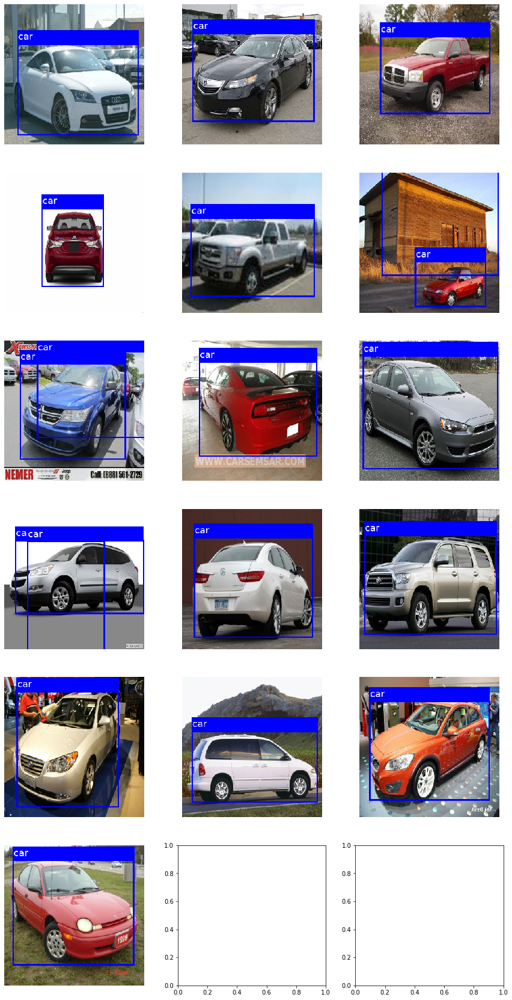

In [13]:
from ssd_utils.metrics import MeanAveragePrecision

mean_AP_metric = MeanAveragePrecision()

model_file = 'resnet50_finetune.h5'
model.load_weights(model_file)

for x, y_true in valid_data:
    predictions = [output_encoder.decode(y, anchors, model)
                   for y in model(x)]
    ground_truth = [y.to_tensor() for y in y_true]
    mean_AP_metric.update_state(ground_truth, predictions)

print('Validation meanAP:', mean_AP_metric.result())
mean_AP_metric.reset_state()     

num_display = 16
num_cols = 3
num_rows = (num_display+num_cols-1) // num_cols

fig, _ = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))

X, Y = next(iter(valid_data))
Y_pred = model(X)

for idx in range(num_display):
    x = X[idx]
    y = output_encoder.decode(Y_pred[idx], anchors, model)
    display_image(x, y, ax=fig.axes[idx])
    
plt.show()